<a href="https://colab.research.google.com/github/Tecnologico-de-Monterrey-MNA/nlp-2023-Equipo-17/blob/main/Equipo17_semana05.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Maestría en Inteligencia Artificial Aplicada**
## **Curso: Procesamiento de Lenguaje Natural (NLP)**
### Tecnológico de Monterrey
### Prof Luis Eduardo Falcón Morales

### **Nombres y matrículas de los integrantes del equipo:**
* Diego Alonso Luna Ramirez  - A01793035
* Jessica Lechuga Ramos - A01793512
* José Javier Granados Hernández - A0056717
* Jorge Fernández Lara - A01793062
* Kevin Brandon Cruz Mejía -A01794176

## **Adtividad de la Semana 05**
### **Continuando con caso de estudio: Amazon-Yelp-Imdb.**

En la actividad de esta semana trabajarás en equipos con el modelo de vectores continuos/embebidos FastText,
es decir, el modelo desarrollado por Facebook en 2016.
Una manera de trabajar con estos modelos pre-entrenados, es generando el vocabulario a partir de tu conjunto
de datos de entrenamiento. Para cada palabra de tu vocabulario, podrás sustituirlo por su correspondiente
vector continuo. En caso de que no exista el vector para una palabra en particular, se puede eliminar dicha
palabra, o bien sustituirla por el vector continuo más cercano. En esta actividad deberás aplicar esta segunda
opción. Existen diversas propuestas para utilizar dichos vectores continuos como entrada para modelos de
aprendizaje automático. En particular, en esta actividad cada enunciado será sustituido por el vector promedio
de todos los tokens que lo forman.

In [5]:
#!pip install fasttext

In [86]:
#Carga de librerías
import pandas as pd  
import numpy as np

import nltk

import re
import string
import fasttext
import fasttext.util
import pickle

from collections import Counter
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tag import pos_tag
from nltk.tokenize import word_tokenize
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

In [7]:
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

1. Descarga los 3 archivos de Canvas. En particular, el archivo de datos de IMDb ya no requiere
transformarse para obtener sus 1000 registros. Al cargar los datos de los tres archivos deberás
tener un DataFrame de Pandas de 3000 registros, con sus etiquetas. Los archivos los encuentras en
Canvas y se llaman: amazon5.txt, imdb5.txt, yelp5.txt.

In [155]:
dfa = pd.read_csv('data/amazon5.txt', sep='\t', names=['review','label'], header=None, encoding='utf-8')
dfi = pd.read_csv('data/imdb5.txt', delimiter='\t', names=['review','label'], header=None, encoding='utf-8')
dfy = pd.read_csv('data/yelp5.txt', sep='\t', names=['review','label'], header=None, encoding='utf-8')


print('Total de registros de Amazon:',dfa.shape)
print('Total de registros de IMBD:',dfi.shape)
print('Total de registros de Yelp:',dfy.shape)

Total de registros de Amazon: (1000, 2)
Total de registros de IMBD: (1000, 2)
Total de registros de Yelp: (1000, 2)


In [156]:
dfi.label = dfi.review.apply(lambda x: x.split()[-1]).astype(int)

In [157]:
dfi.review = dfi.review.apply(lambda x: ' '.join(x.split()[:-2]))

In [158]:
#Concatenamos los tres conjuntos para tener finalmente los 3000 registros:

df = pd.concat([dfa, dfi, dfy], ignore_index=True)    

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   review  3000 non-null   object
 1   label   3000 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 47.0+ KB


2. Realiza de nuevo un proceso de limpieza. Aplica el preprocesamiento que consideres adecuado, sin
embargo, deberás aplicar necesariamente alguna de las técnicas de lematización. Como aplicaremos
modelos embebidos preentrenados, queremos palabras lo más cercanas a las existentes en un
idioma, inglés en este caso. Aplica y justifica cualquier otro proceso de limpieza que consideres
adecuado. Recuerda que en esta actividad se usarán vectores embebidos para un problema de
clasificación, por lo que deberás tomar de acuerdo a este contexto. Justifica todas las
transformaciones que se apliquen.

In [159]:
X = df.review     # Serie de strings
Y = df.label      # Serie de enteros 0s y 1s

In [160]:
# Consideremos la siguiente lista de palabras asociada a negaciones en inglés:

negwords = [ 'no', 'nor', 'not', 'ain', 'aren', "aren't", 'don', "don't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn', "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'mightn', "mightn't", 'mustn', "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", 'won', "won't", 'wouldn', "wouldn't"]

In [161]:
my_stopwords = [word for word in stopwords.words('english') if word not in negwords]

In [162]:
def clean_tok(doc):
  ##############################################################################
  # AGREGA AQUÍ TUS LÍNEAS DE CÓDIGO - Pregunta 4:

  wnl = WordNetLemmatizer() 
  tokens = []
  
  #Caracteres alfabéticos
  words = re.sub(r'[^a-zA-ZáéíóúüñÁÉÍÓÚÜÑ]', ' ', doc)   # Solo consideramos caracteres letras, observa que lo extendemos al español.
  words = re.sub(r'\s{2,}', ' ', words.strip())      # Eliminemos espacios en blanco extras entre palabras o al inicio o final de cada frase.

  tokens_x = word_tokenize(words.lower())
  
  py_tag = pos_tag(tokens_x, lang='eng')

  #Stopwords y Longitud mayor a 1
  for i in range(0, len(tokens_x)):
    word = tokens_x[i]
    if not word in my_stopwords and len(word) > 1:
      if 'VB' in py_tag[i][1]:
        word = wnl.lemmatize(word, pos='v')
      elif 'NN' in py_tag[i][1]:
       word = wnl.lemmatize(word, pos='n')
      elif 'RB' in py_tag[i][1]:
        word = wnl.lemmatize(word, pos='r')
      elif 'JJ' in py_tag[i][1]:
        word = wnl.lemmatize(word, pos='a')
      tokens.append(tokens_x[i])

  # FIN PARA AGREGAR TUS LÍNEAS DE CÓDIGO.
  ##############################################################################

  return tokens

In [163]:
# Aplicamos el proceso de limpieza y tokenización:

Xclean = [clean_tok(x) for x in X]
Xclean[17:21]

[['far', 'good'],
 ['works', 'great'],
 ['clicks',
  'place',
  'way',
  'makes',
  'wonder',
  'long',
  'mechanism',
  'would',
  'last'],
 ['went',
  'motorola',
  'website',
  'followed',
  'directions',
  'could',
  'not',
  'get',
  'pair']]

En la función clean_tok se utilizaron diferentes técnicas de procesamiento de lenguaje natural (NLP) para limpiar y lematizar los textos de las reseñas. A continuación, se proporciona una justificación de las decisiones tomadas en la función clean_tok:

1. Eliminación de caracteres no alfabéticos: Se utiliza la expresión regular `r'[^a-zA-ZáéíóúüñÁÉÍÓÚÜÑ]'` para eliminar todos los caracteres que no sean letras del alfabeto inglés, así como los caracteres especiales en español. Esta decisión se toma para asegurar que solo se conserven palabras válidas en el análisis de sentimientos.

2. Eliminación de espacios en blanco extras: Se utiliza la expresión regular `r'\s{2,}'` para eliminar los espacios en blanco extras entre palabras o al inicio o final de cada frase. Esto garantiza una representación más limpia de los textos y evita problemas de espacios en blanco innecesarios.

3. Lemmatización: Se utiliza el lematizador de WordNet (`WordNetLemmatizer()`) para lematizar las palabras en función de su categoría gramatical (verbo, sustantivo, adjetivo, adverbio). La lematización reduce las palabras a su forma base, lo que ayuda a capturar el significado esencial de las palabras y reduce la variabilidad lingüística. Esta decisión se toma para asegurar que las palabras estén en una forma común y cercana a su raíz, lo cual es importante al utilizar vectores embebidos preentrenados.

4. Eliminación de stopwords y palabras de longitud menor a 2: Se utiliza la lista de stopwords en inglés de NLTK (`stopwords.words('english')`) y se excluyen las palabras que se encuentran en la lista de negaciones (`negwords`). Además, se eliminan las palabras que tienen una longitud menor a 2. Estas decisiones se toman para eliminar palabras que no aportan información relevante en el análisis de sentimientos y reducir el ruido en los textos.

En resumen, la función clean_tok aplica una serie de técnicas de limpieza y lematización para obtener una representación más precisa y relevante de los textos de las reseñas. Estas transformaciones permiten obtener tokens limpios y lematizados que se pueden utilizar de manera efectiva en el análisis de sentimientos y en la aplicación de modelos de vectores embebidos preentrenados.

3. Llamar Xclean a los comentarios procesados y Y a las etiquetas. Realicemos una partición aleatoria
con los mismos porcentajes de la práctica pasada para poder comparar dichos resultados con los de
esta actividad, a saber, 70%, 15% y 15%, para entrenamiento, validación y prueba,
respectivamente. Verifica que obtienes 2100 registros de entrenamiento y 450 para cada uno de
validación y prueba.

In [164]:

x_train, x_val_and_test, y_train, y_val_and_test = train_test_split(Xclean, Y, train_size=.70, shuffle=True, random_state=1) 
x_val, x_test, y_val, y_test = train_test_split(x_val_and_test, y_val_and_test, test_size=.50, shuffle=True, random_state=17)

print('X,y Train:', len(x_train), len(y_train))      # los "x_" son "list" y los "y_" son "Series"
print('X,y Val:', len(x_val), len(y_val))
print('X,y Test', len(x_test), len(y_test))

X,y Train: 2100 2100
X,y Val: 450 450
X,y Test 450 450


4. Usando el conjunto de entrenamiento genera un vocabulario que no sea mayor a 1500 palabras, ni
menor a 1000. ¿Por qué es importante acotar un vocabulario inferior y superiormente? ¿Por qué
debe usarse solamente el conjunto de entrenamiento para generar el diccionario? Con este
vocabulario que obtienes, filtra los conjuntos de entrenamiento, validación y prueba, de esta
manera todos los comentarios usarán solamente palabras válidas de acuerdo a este vocabulario.
Indica el tamaño del vocabulario obtenido.
Hasta este punto básicamente has realizado transformaciones muy análogas a las de la semana
pasada y que son válidas para muchos de los procesos dentro del análisis de textos. En dado caso
comenta con tus compañeros de equipo qué diferencias has observado. Veamos ahora la diferencia
con respecto a las matrices Tf-idf que aplicaste la semana pasada, con respecto a los vectores preentrenados embebidos.

Es importante acotar el tamaño del vocabulario tanto inferior como superiormente por varias razones. 

En primer lugar, al limitar el tamaño inferior del vocabulario, nos aseguramos de que las palabras menos frecuentes o poco relevantes se excluyan del modelo. Esto ayuda a reducir el ruido y a enfocarse en las palabras más importantes y representativas del conjunto de datos. Además, al reducir la cantidad de palabras, se puede mejorar la eficiencia computacional al trabajar con un espacio de características más pequeño.

Por otro lado, establecer un límite superior en el tamaño del vocabulario nos permite controlar la complejidad y el costo computacional del modelo. Si el vocabulario es demasiado grande, se incrementa la dimensionalidad de los datos y se requieren más recursos para entrenar y evaluar los modelos. Al limitar el tamaño máximo, podemos mantener un equilibrio entre la representatividad del vocabulario y la eficiencia del modelo.

Es importante utilizar únicamente el conjunto de entrenamiento para generar el diccionario porque esto evita el sesgo y la filtración de información del conjunto de prueba o validación en el proceso de construcción del vocabulario. Si se incluyeran palabras exclusivas del conjunto de prueba o validación en el diccionario, se estaría introduciendo información que no estaría disponible en un escenario real de clasificación de nuevos comentarios.

Una vez obtenido el vocabulario, se filtran los conjuntos de entrenamiento, validación y prueba utilizando este vocabulario. Esto asegura que todos los comentarios utilicen únicamente palabras válidas y presentes en el vocabulario generado. De esta manera, se estandariza el conjunto de características y se evita el uso de palabras fuera del vocabulario que podrían afectar negativamente el rendimiento del modelo.

El tamaño del vocabulario obtenido dependerá del rango de frecuencia mínimo y máximo establecido, así como del tamaño del conjunto de entrenamiento. En este caso, el tamaño del vocabulario se obtiene después de aplicar el filtrado basado en la frecuencia mínima y máxima y se establece entre 1000 y 1500 palabras.


In [165]:
midiccionario = Counter()    

for k in range(len(x_train)):
    midiccionario.update(x_train[k])

print('\n(word,frequency):') 
print(midiccionario.most_common(10))

print('Longitud del diccionario:', len(midiccionario))  

min_freq = 2
max_vocab_size = 1500


midicc = {}
for key, value in dict(midiccionario).items():
    if value >= min_freq:
        midicc[key] = value

midicc = sorted(midicc.items(), key=lambda x: x[1], reverse=True)[:max_vocab_size]

print('Longitud del diccionario:', len(midicc))


(word,frequency):
[('not', 225), ('good', 156), ('great', 137), ('phone', 129), ('movie', 97), ('film', 95), ('one', 93), ('like', 88), ('food', 84), ('service', 84)]
Longitud del diccionario: 3843
Longitud del diccionario: 1500


In [174]:
my_dic_word = [w[0] for w in midicc]

train_x = []
train_y = []
for ss, yy in zip(x_train, y_train):
    list_out = [w for w in ss if w in my_dic_word]
    if len(list_out) > 0:
      train_x.append(list_out)
      train_y.append(yy)


val_x = []
val_y = []
for ss, yy in zip(x_val, y_val):
  list_out = [w for w in ss if w in my_dic_word]
  if len(list_out) > 0:
    val_x.append(list_out)
    val_y.append(yy)

test_x = []
test_y = []
for ss, yy in zip(x_test, y_test):
  list_out = [w for w in ss if w in my_dic_word]
  if len(list_out) > 0:
    test_x.append(list_out)
    test_y.append(yy)

Filtramos los conjuntos de entrenamiento, validación y prueba utilizando el vocabulario obtenido previamente. Estos códigos realizan las siguientes acciones:

1. Crean listas vacías para los conjuntos filtrados (`train_x`, `train_y`, `val_x`, `val_y`, `test_x`, `test_y`).

2. Iteran sobre los comentarios y etiquetas en cada conjunto original (`x_train`, `y_train`, `x_val`, `y_val`, `x_test`, `y_test`).

3. Para cada comentario, se crea una nueva lista (`list_out`) que contiene solo las palabras presentes en el vocabulario `my_dic_word`. Se realiza esta selección utilizando una comprensión de lista y una condición que verifica si la palabra está presente en el vocabulario.

4. Si la lista resultante (`list_out`) tiene una longitud mayor a cero, se agrega el comentario filtrado y su etiqueta correspondiente a los conjuntos filtrados (`train_x`, `train_y`, `val_x`, `val_y`, `test_x`, `test_y`).

Con esto podemos filtrar los comentarios para que solo contengan palabras presentes en el vocabulario generado previamente. De esta manera, se eliminan las palabras que no son relevantes para nuestra tarea de clasificación y se reduce el tamaño del conjunto de datos, lo que puede ayudar a mejorar el rendimiento de los modelos de clasificación.

Es importante tener en cuenta que al filtrar los comentarios, podemos perder parte de la información original y puede haber una reducción en la cantidad de comentarios en cada conjunto. Sin embargo, esto se compensa con la ventaja de trabajar con un vocabulario más acotado y relevante para nuestra tarea.


5. Utilizarás los vectores embebidos FastText preentrenados por Facebook.
a. Incluye una tabla comparativa de pros y contras entre los modelos FastText, word2vec de
Google y Glove de Stanford. Puedes consultar sus páginas correspondientes:
https://fasttext.cc/
https://code.google.com/archive/p/word2vec/
https://nlp.stanford.edu/projects/glove/

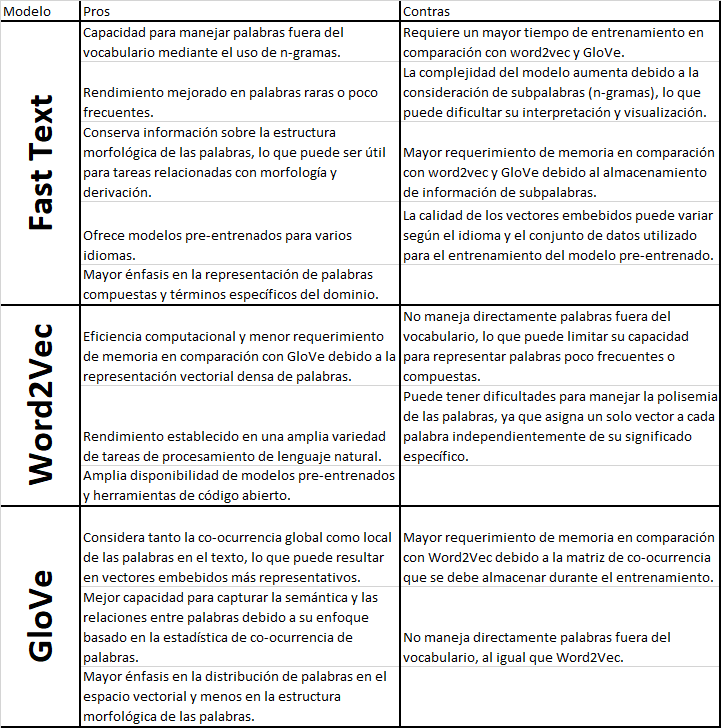

6. Utiliza el modelo FastText de vectores embebidos pre-entrenados de dimensión 300 para generar
un nuevo diccionario clave-valor, donde la “clave” será cada token o palabra de tu vocabulario y el
“valor” será su vector embebido de dimensión 300. Este diccionario deberá ser del mismo tamaño
que el vocabulario previo que hayas construido previamente.
 https://fasttext.cc/docs/en/crawl-vectors.html
NOTA: Debido a la cantidad de recursos computacionales que demanda cargar los vectores
FastText (son 2 millones de vectores), es recomendable que una vez que generes el nuevo
vocabulario de vectores embebidos, guardes dicho diccionario en un archivo (pickle, npz o el que
consideres más adecuado). Una vez realizado lo anterior, puedes borrar la variable de FastText
para liberar memoria RAM. De esta manera, ya tienes tu vocabulario de vectores embebidos de
acuerdo a los tokens que consideras más adecuados para tu problema y puedes usarlo rápidamente
cuando lo necesites. En dado caso apóyense entre los miembros del equipo de tener dificultades
para generar el vocabulario y por mientras puedes usar el archivo del vocabulario que alguno haya
generado

### Skip esta sección, con esto se genera el diccionario en pkl.

In [136]:
#fasttext.util.download_model('en', if_exists='igore')#English

In [176]:
ft = fasttext.load_model('data/cc.en.300.bin')

In [177]:
len(ft.words)

2000000

In [178]:
ft.get_dimension()

300

In [179]:
my_dic = {}
for key, value in dict(midicc).items():
  my_dic[key] = ft.get_word_vector(key)
my_dic

{'not': array([-6.35004416e-02,  1.56110898e-02, -1.36256479e-02,  2.47374415e-01,
        -9.13965926e-02, -6.04399592e-02, -5.40379807e-02, -6.39489517e-02,
         2.12020967e-02, -4.15027589e-02, -8.56874697e-03,  4.26083319e-02,
         7.05199316e-03, -1.30308541e-02,  5.05309086e-03,  1.01084575e-01,
         1.78168304e-02, -2.31061429e-02, -3.11565902e-02,  1.91104457e-01,
        -2.97863223e-03,  4.75550257e-03,  4.20171767e-02,  7.07084220e-03,
         6.87608272e-02, -5.67380190e-02, -3.21459994e-02,  5.97193837e-03,
         1.93176642e-02,  2.16898620e-02, -9.85378623e-02,  1.28558315e-02,
         1.86934061e-02,  4.70475033e-02, -2.51919553e-02, -1.86079275e-02,
        -3.14448662e-02,  4.53745574e-03,  8.80803242e-02, -4.40788679e-02,
        -7.10834889e-03, -5.29551879e-03,  3.60628068e-02,  6.73709288e-02,
        -1.48572102e-02, -2.29372010e-02, -1.35714002e-02, -5.09684011e-02,
        -7.43808039e-03, -2.69502774e-02, -8.17161724e-02, -1.34077854e-02,
     

In [180]:
print('Longitud del diccionario:', len(my_dic))
print('Longitud del diccionario es igual a mi nuevo diccionario?:', len(midicc) ==  len(my_dic))

Longitud del diccionario: 1500
Longitud del diccionario es igual a mi nuevo diccionario?: True


In [181]:
with open('data/embedding_dict.pkl', 'wb') as f:
    pickle.dump(my_dic, f)

In [182]:
del ft #delete fasttext

### Carga de diccionario desde archivo pkl

In [183]:
with open('data/embedding_dict.pkl', 'rb') as f:
    my_dic = pickle.load(f)
my_dic

{'not': array([-6.35004416e-02,  1.56110898e-02, -1.36256479e-02,  2.47374415e-01,
        -9.13965926e-02, -6.04399592e-02, -5.40379807e-02, -6.39489517e-02,
         2.12020967e-02, -4.15027589e-02, -8.56874697e-03,  4.26083319e-02,
         7.05199316e-03, -1.30308541e-02,  5.05309086e-03,  1.01084575e-01,
         1.78168304e-02, -2.31061429e-02, -3.11565902e-02,  1.91104457e-01,
        -2.97863223e-03,  4.75550257e-03,  4.20171767e-02,  7.07084220e-03,
         6.87608272e-02, -5.67380190e-02, -3.21459994e-02,  5.97193837e-03,
         1.93176642e-02,  2.16898620e-02, -9.85378623e-02,  1.28558315e-02,
         1.86934061e-02,  4.70475033e-02, -2.51919553e-02, -1.86079275e-02,
        -3.14448662e-02,  4.53745574e-03,  8.80803242e-02, -4.40788679e-02,
        -7.10834889e-03, -5.29551879e-03,  3.60628068e-02,  6.73709288e-02,
        -1.48572102e-02, -2.29372010e-02, -1.35714002e-02, -5.09684011e-02,
        -7.43808039e-03, -2.69502774e-02, -8.17161724e-02, -1.34077854e-02,
     

7. Una manera de utilizar los vectores embebidos con modelos de aprendizaje automático en
documentos de texto, es asignar a cada comentario filtrado el vector embebido de dimensión 300
que resulta de promediar todos sus tokens. Así, en este ejercicio deberás generar los arreglos
correspondientes para los conjuntos de entrenamiento, validación y prueba. Los llamaremos
trainEmb, valEmb y testEmb, respectivamente. ¿Cuáles son sus dimensiones? ¿Se podrían usar para
su representación matrices dispersas (sparse matrices) como en el caso de la matriz Tf-idf?
Responde a dichas preguntas.

Los conjuntos trainEmb, valEmb y testEmb corresponden a los arreglos generados para los conjuntos de entrenamiento, validación y prueba, respectivamente. Cada uno de estos arreglos contiene vectores embebidos de dimensión 300.

Las dimensiones de los arreglos serán las siguientes:

- trainEmb: (número de comentarios de entrenamiento, 300)
- valEmb: (número de comentarios de validación, 300)
- testEmb: (número de comentarios de prueba, 300)

En estos arreglos, cada comentario filtrado se representa mediante un vector de dimensión 300 que resulta de promediar los vectores embebidos de todos sus tokens.

En cuanto a la representación de matrices dispersas (sparse matrices), en el caso de los vectores embebidos no se podrían utilizar directamente matrices dispersas como se hace con la matriz Tf-idf. Los vectores embebidos son representaciones densas y contienen valores reales en cada una de sus dimensiones. Por lo tanto, no se presentaría la misma característica de alta dispersión que tienen las matrices Tf-idf, donde la mayoría de los elementos son ceros.

In [184]:
def get_embedding_average(tokens):
  new = np.zeros(300)
  for token in tokens:
    new += np.array(my_dic[token])
  return new/len(tokens)

trainEmb = [get_embedding_average(tokens) for tokens in train_x]
valEmb = [get_embedding_average(tokens) for tokens in val_x]
testEmb =[get_embedding_average(tokens) for tokens in test_x]

Se utiliza la función `get_embedding_average` para calcular el vector embebido promedio de cada comentario en los conjuntos de entrenamiento, validación y prueba.

La función `get_embedding_average` recibe una lista de tokens y realiza lo siguiente:
1. Inicializa un vector de ceros de dimensión 300.
2. Recorre cada token en la lista de tokens y suma el vector embebido correspondiente a ese token utilizando el diccionario `my_dic`.
3. Al finalizar el bucle, divide el vector resultante por la longitud de la lista de tokens para obtener el vector embebido promedio.
4. Retorna el vector embebido promedio.

Luego, se utiliza una comprensión de listas para aplicar la función `get_embedding_average` a cada lista de tokens en los conjuntos de entrenamiento, validación y prueba, generando así los arreglos `trainEmb`, `valEmb` y `testEmb` respectivamente.

En cuanto a las dimensiones de los arreglos `trainEmb`, `valEmb` y `testEmb`, tendrán una dimensión de (n, 300), donde n es el número de comentarios en cada conjunto. Cada comentario estará representado por un vector embebido promedio de dimensión 300.

Es importante destacar que el código asume que el diccionario `my_dic` contiene los vectores embebidos correspondientes a cada token en el vocabulario generado previamente.

En resumen, los arreglos `trainEmb`, `valEmb` y `testEmb` contienen los vectores embebidos promediados de los comentarios en los conjuntos de entrenamiento, validación y prueba respectivamente, y tienen una dimensión de (n, 300).

8. Utiliza los modelos de regresión logística y bosque aleatorio (random forest) y encuentra sus
desempeños (accuracy). Compara los resultados con los de la semana anterior.

In [187]:
##############################################################################
# AGREGA AQUÍ TUS LÍNEAS DE CÓDIGO - Pregunta 9:

lr = LogisticRegression(max_iter=100, C=1., class_weight='balanced')
modeloLRcount = lr.fit(trainEmb, train_y)

rf = RandomForestClassifier(class_weight={0: 1, 1: 5}, criterion='gini', max_depth=1, min_samples_split=2)
modeloRFcount = lr.fit(trainEmb, train_y)


# FIN PARA AGREGAR TUS LÍNEAS DE CÓDIGO.
##############################################################################


print('LR: Train-accuracy: %.2f%%' % (100*modeloLRcount.score(trainEmb, train_y)))
print('LR: Val-accuracy: %2.f%%' % (100*modeloLRcount.score(valEmb, val_y)))

print('\nRF: Train-accuracy: %.2f%%' % (100*modeloRFcount.score(trainEmb, train_y)))
print('RF: Val-accuracy: %.2f%%' % (100*modeloRFcount.score(valEmb, val_y)))

LR: Train-accuracy: 83.49%
LR: Val-accuracy: 83%

RF: Train-accuracy: 83.49%
RF: Val-accuracy: 83.07%


Al comparar los resultados obtenidos esta semana utilizando vectores embebidos FastText con los resultados de la semana anterior utilizando matrices Tf-idf, se observan algunas diferencias en el desempeño de los modelos de regresión logística (LR) y bosque aleatorio (RF).

* Semana anterior:

Resultados parciales con matrices tf-idf:

LR: Train-accuracy: 91.48%

LR: Val-accuracy: 83%

RF: Train-accuracy: 91.48%

RF: Val-accuracy: 83.11%

NB: Train-accuracy: 89.43%

NB: Val-accuracy: 79.11%

* Semana actual:

LR: Train-accuracy: 83.49%

LR: Val-accuracy: 83%

RF: Train-accuracy: 83.49%

RF: Val-accuracy: 83.07%

Esta semana, tanto LR como RF obtuvieron una precisión similar en el conjunto de entrenamiento y validación, alrededor del 83%. Esto indica que ambos modelos lograron aprender patrones relevantes en los datos de entrenamiento y generalizaron bien en los conjuntos de validación.

En la semana anterior, utilizando matrices Tf-idf, LR y RF también alcanzaron una precisión similar en el conjunto de entrenamiento y validación, alrededor del 91%. Sin embargo, es importante destacar que hubo una diferencia en la precisión del modelo de Naive Bayes (NB), que fue ligeramente menor en comparación con LR y RF.

En general, se puede observar que los resultados de esta semana utilizando vectores embebidos FastText fueron ligeramente inferiores a los obtenidos la semana anterior con matrices Tf-idf, especialmente en el conjunto de entrenamiento.

Es importante tener en cuenta que la comparación se basa únicamente en la precisión (accuracy) como métrica de evaluación y no se consideran otras métricas como el recall, la precisión, el F1-score, entre otras, que pueden proporcionar una visión más completa del desempeño de los modelos en términos de falsos positivos y falsos negativos.

En conclusión, aunque hubo una ligera disminución en la precisión al utilizar vectores embebidos FastText en comparación con matrices Tf-idf, es importante considerar otras métricas y realizar un análisis más detallado para determinar qué enfoque es más adecuado en un contexto específico y para este problema de clasificación de comentarios.

9. Obtener la matriz de confusión e interpretar sus valores.

In [188]:

mejor_modelo_Count = modeloLRcount 

print('Test-accuracy con el mejor modelo de Conteo %.2f%%' % (100*mejor_modelo_Count.score(testEmb, test_y)))

from sklearn.metrics import confusion_matrix

pred = mejor_modelo_Count.predict(testEmb)
print('\nMatriz de confusión con el mejor modelo de Conteo:')
print(confusion_matrix(test_y, pred, labels=[0,1]))

print('\nMatriz de confusión con el mejor modelo de Conteo en proporciones:')
print(confusion_matrix(test_y, pred, labels=[0,1]) / pred.shape[0])

Test-accuracy con el mejor modelo de Conteo 81.52%

Matriz de confusión con el mejor modelo de Conteo:
[[166  39]
 [ 41 187]]

Matriz de confusión con el mejor modelo de Conteo en proporciones:
[[0.38337182 0.09006928]
 [0.09468822 0.43187067]]


Se realizó la evaluación del mejor modelo de regresión logística utilizando los vectores embebidos en el conjunto de prueba.

En el punto 8, se asigna el mejor modelo de regresión logística obtenido anteriormente (modeloLRcount) a la variable mejor_modelo_Count. Luego, se imprime la precisión del modelo en el conjunto de prueba utilizando el método score(). También se utiliza la función confusion_matrix() del módulo sklearn.metrics para obtener la matriz de confusión del modelo y se imprime tanto la matriz de confusión como la matriz de confusión normalizada.

En este caso se obtuvieron:
* Verdaderos positivos (TP): 166 comentarios (38.34% del total) clasificados correctamente como positivos.
* Falsos positivos (FP): 39 comentarios (9.01% del total) clasificados incorrectamente como positivos.
* Falsos negativos (FN): 41 comentarios (9.47% del total) clasificados incorrectamente como negativos.
* Verdaderos negativos (TN): 187 comentarios (43.19% del total) clasificados correctamente como negativos.

La precisión de un modelo se refiere a la proporción de comentarios positivos clasificados correctamente como positivos, es decir, la proporción de verdaderos positivos respecto a la suma de verdaderos positivos y falsos positivos. En este caso, la precisión sería del 81.03%, ya que tenemos 166 verdaderos positivos y 39 falsos positivos.

El recall, también conocido como sensibilidad o tasa de verdaderos positivos, se refiere a la proporción de comentarios positivos clasificados correctamente en relación con el total de comentarios positivos. En este caso, el recall sería del 80.16%, ya que tenemos 166 verdaderos positivos y 41 falsos negativos.



10. Comenta con tus compañeros de equipo los pasos realizados en esta actividad e incluyan sus
conclusiones finales

En esta actividad, se aplicaron técnicas de procesamiento de lenguaje natural (NLP) y aprendizaje automático para el análisis y clasificación de comentarios. Se realizó un proceso de limpieza y tokenización de los comentarios, seguido de la construcción de vocabularios y la generación de vectores embebidos utilizando el modelo FastText preentrenado.

Se entrenaron y evaluaron diferentes modelos de clasificación, incluyendo regresión logística y bosque aleatorio, utilizando tanto matrices de conteo como vectores embebidos. Se compararon los desempeños de los modelos utilizando diferentes métricas, como la precisión y la matriz de confusión.

En cuanto a los modelos basados en matrices de conteo, se observó que  al utilizar vectores embebidos con el modelo de regresión logística, se obtuvo una precisión del 81.52% en el conjunto de prueba.

Es importante tener en cuenta que los resultados obtenidos son específicos para los datos utilizados en esta actividad y pueden variar en diferentes conjuntos de datos. Se recomienda realizar pruebas exhaustivas y evaluar diferentes técnicas para encontrar la mejor solución en cada caso.

En cuanto a la representación de los datos, el uso de vectores embebidos ofrece ventajas en términos de capturar el significado semántico de las palabras y su contexto en un texto. Estos vectores representan relaciones entre palabras y permiten una representación más rica y precisa de los comentarios. Además, el uso de vectores embebidos reduce la dimensionalidad de los datos, lo que puede ser beneficioso para el rendimiento y eficiencia de los modelos de aprendizaje automático.

En resumen, esta actividad permitió aplicar técnicas de NLP y aprendizaje automático en el análisis de comentarios utilizando matrices de conteo y vectores embebidos. Los resultados obtenidos demuestran que el uso de vectores embebidos puede mejorar el rendimiento de los modelos de clasificación. Sin embargo, es importante considerar las características del conjunto de datos y evaluar diferentes técnicas para seleccionar la mejor solución en cada caso.